In [1]:
import os
import cv2
import time
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim

from torchvision import models
import torchvision.transforms as transforms
import albumentations as A

## Set-up

In [2]:
# pretrained model
vgg = models.vgg19(pretrained=True)
for param in vgg.parameters():
    param.requires_grad = False

# smaller size is helpful for iterating (don't have to wait so long to train)

# size
#size = (576, 768)
#size = (288, 384)
size = (384, 288)

# resize the image
content_img = cv2.resize(cv2.cvtColor(cv2.imread('content_img.jpg'), cv2.COLOR_BGR2RGB), (size[0], size[1]))
style_img = cv2.resize(cv2.cvtColor(cv2.imread('style_img.jpg')[90:-200, 38:-38,:], cv2.COLOR_BGR2RGB) , (size[0], size[1]))

# some other images I did (ignore)
#content_img = cv2.resize(cv2.cvtColor(cv2.imread('content_img2.jpg')[:, :800,:], cv2.COLOR_BGR2RGB), (size[0], size[1]))
#style_img = cv2.resize(cv2.cvtColor((cv2.imread('style_img2.jpg')), cv2.COLOR_BGR2RGB) , (size[0], size[1]))

#content_img = cv2.resize(cv2.cvtColor(cv2.imread('content_img0.jpg'), cv2.COLOR_BGR2RGB), (size[0], size[1]))
#style_img = cv2.resize(cv2.cvtColor((cv2.imread('style_img0.jpg'))[100:-100, :,:], cv2.COLOR_BGR2RGB) , (size[0], size[1]))

plt.rcParams['figure.figsize'] = [12, 8]

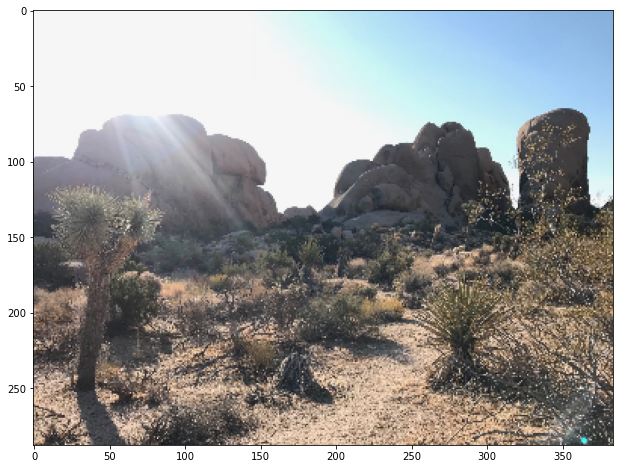

In [3]:
# a photo I took at Joshua Tree this summer
plt.imshow(content_img)

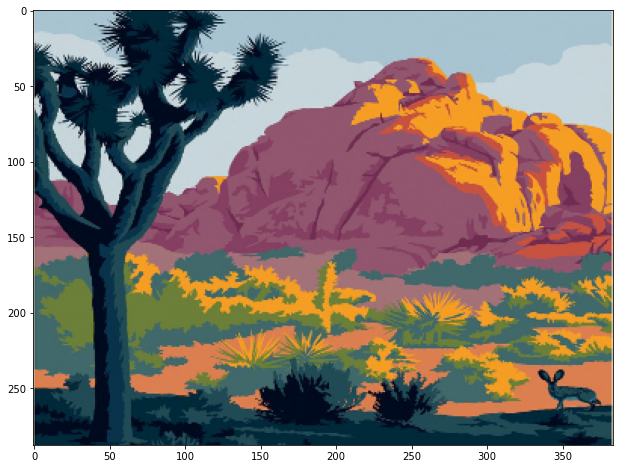

In [4]:
# a poster from the Joshua Tree National Park Retro Ranger series (By Aaron Johnson, Joel Anderson)
# a bit stretched to make sure they are the same size
plt.imshow(style_img)

In [5]:
# lots of stuff in vgg
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [6]:
# we just need this piece for the content

def get_content(input_tensor, idx):
    return vgg.features[:idx](input_tensor)

In [7]:
# style matrix, assuming batch_size = 1
def calc_style_matrix(input_tensor):
    channels = input_tensor.shape[1]
    x_dim = input_tensor.shape[2]
    y_dim = input_tensor.shape[3]
    
    # turn into channel-many vectors
    input_tensor_resized = input_tensor.view(channels, x_dim * y_dim)
    
    # then we compute the gram matrix of these vectors
    # equivalent to multiplying the matrix of vectors by the transpose (think about this!)
    style_matrix = torch.mm(input_tensor_resized, input_tensor_resized.t())
    
    # scale matrix by number of total features
    style_matrix = style_matrix / (channels * x_dim * y_dim)
    
    return style_matrix

# get the style matrix for a particular layer
def get_style_matrix(input_tensor, model, idx):
    output_tensor = model[:idx](input_tensor)
    return calc_style_matrix(output_tensor)

In [8]:
# create a module to normalize the image with respect to ImageNet
class Normalization(nn.Module):
    def __init__(self, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
        super(Normalization, self).__init__()
        
        self.mean_tensor = torch.zeros((1, 3, size[1], size[0]))
        self.std_tensor = torch.zeros((1, 3, size[1], size[0]))
        
        for i in range(3):
            self.mean_tensor[:, i, :, :] = mean[i]
            self.std_tensor[:, i, :, :] = std[i]

    def forward(self, img):
        # normalize the image
        return (img - self.mean_tensor) / self.std_tensor

norm = Normalization()

# prep image for input into VGG
def img_to_tensor(img):
    return torch.unsqueeze(torch.tensor(np.transpose(img / 255., (2, 0, 1))), 0).float()

In [9]:
# get content features
content_img_tensor = img_to_tensor(content_img)

# You can add more content layers to keep more of the detail from the original image
content_layers = [36]

# need to normalize before "getting the content"
content_features = [get_content(norm(content_img_tensor), i) for i in content_layers]

/Users/mruddy/opt/anaconda3/envs/pytorch_env/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ../c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [10]:
# get style matrix
style_img_tensor = img_to_tensor(style_img)

# Can't decide if earlier or later in the ConvBlocks is better for style transfer (you should try some experiments!)
#style_layers = [2, 7, 12, 21, 30]
style_layers = [4, 9, 18, 27, 36]

# need to normalize before "getting the style"
style_matrices = [get_style_matrix(norm(style_img_tensor), vgg.features, i) for i in style_layers]

In [11]:
# construct the loss function
# gamma needs to be balanced differently depending on your start tensor
# play w/ L1?
# play with gamma?
# you should try implementing weights for each desired layer!
class NSTLoss(nn.Module):
    def __init__(self, contents, styles, gamma=10**8):
        super(NSTLoss, self).__init__()
        self.content_loss = nn.MSELoss()
        self.style_loss = nn.MSELoss()
        self.gamma = gamma
        
        # detach from gradient computation
        self.content_features = [content.detach() for content in contents]
        self.style_features = [style.detach() for style in styles]
        
    def forward(self, content, style):
        
        # content loss
        content_loss = 0
        for pred_content, true_content in zip(content, self.content_features):
            content_loss += self.content_loss(pred_content, true_content)
        
        # style loss
        style_loss = 0
        for pred_style, true_style in zip(style, self.style_features):
            style_loss += self.style_loss(pred_style, true_style)
        
        # average over each layer
        style_loss = self.gamma * (style_loss / len(style))
        content_loss = content_loss / len(content)
        
        # printing output here so I can see both content and style losses
        print("Content Loss:", content_loss.item(), "Style Loss:", style_loss.item())
        
        return content_loss + style_loss

lossFun = NSTLoss(content_features, style_matrices)

In [12]:
# use random noise as starting point
#input_img =  torch.rand((1, 3, size[1], size[0]))

# use content image as starting point
input_img = content_img_tensor

In [13]:
# feed the image pixels into the optimizer as parameters
# I found that any higher of a learning rate made for unstable training (a lot of noise, instead of style)
# if you are training from random noise you will need to anneal your learning rate (high then low)
optimizer = optim.Adam([input_img.requires_grad_()], lr=0.01)

  0%|          | 0/300 [00:00<?, ?it/s]

Content Loss: 0.0 Style Loss: 14592.2529296875


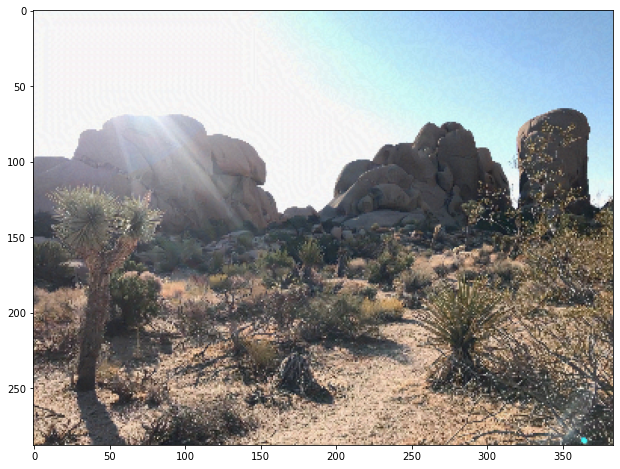

Content Loss: 0.16640789806842804 Style Loss: 12038.5068359375
Content Loss: 0.36266663670539856 Style Loss: 9367.78515625
Content Loss: 0.47283270955085754 Style Loss: 7726.52197265625
Content Loss: 0.42686736583709717 Style Loss: 6539.2109375
Content Loss: 0.41511309146881104 Style Loss: 5675.830078125
Content Loss: 0.42788320779800415 Style Loss: 4960.96826171875
Content Loss: 0.4369843304157257 Style Loss: 4379.16455078125
Content Loss: 0.428832471370697 Style Loss: 3890.150390625
Content Loss: 0.4140084981918335 Style Loss: 3476.798828125
Content Loss: 0.40466561913490295 Style Loss: 3118.8662109375
Content Loss: 0.400960236787796 Style Loss: 2814.071533203125
Content Loss: 0.39660778641700745 Style Loss: 2556.972900390625
Content Loss: 0.3922170102596283 Style Loss: 2337.542236328125
Content Loss: 0.39123713970184326 Style Loss: 2149.2236328125
Content Loss: 0.39381593465805054 Style Loss: 1985.81640625
Content Loss: 0.3954441547393799 Style Loss: 1843.094482421875
Content Loss: 

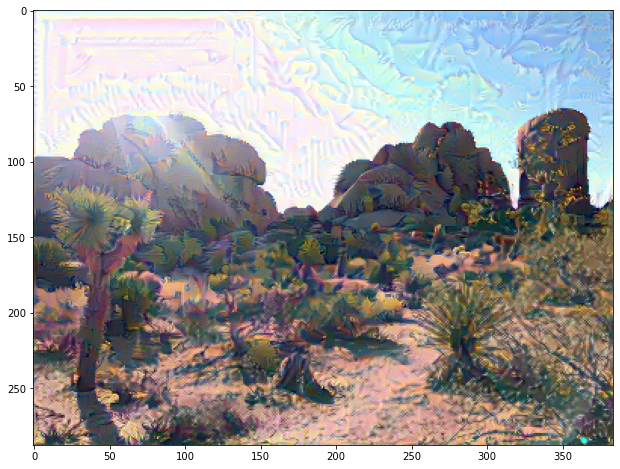

Content Loss: 0.3919166326522827 Style Loss: 1340.0872802734375
Content Loss: 0.3902255892753601 Style Loss: 1268.3214111328125
Content Loss: 0.3892928659915924 Style Loss: 1202.763916015625
Content Loss: 0.3875526487827301 Style Loss: 1142.7664794921875
Content Loss: 0.3857041597366333 Style Loss: 1087.5113525390625
Content Loss: 0.38482794165611267 Style Loss: 1035.99462890625
Content Loss: 0.38429495692253113 Style Loss: 987.9191284179688
Content Loss: 0.38348403573036194 Style Loss: 943.3916625976562
Content Loss: 0.38216432929039 Style Loss: 901.9431762695312
Content Loss: 0.3810451626777649 Style Loss: 862.974853515625
Content Loss: 0.3797350525856018 Style Loss: 826.458740234375
Content Loss: 0.3778724670410156 Style Loss: 792.193603515625
Content Loss: 0.37628138065338135 Style Loss: 759.9126586914062
Content Loss: 0.3749833405017853 Style Loss: 729.5617065429688
Content Loss: 0.3737097978591919 Style Loss: 700.9797973632812
Content Loss: 0.3721679151058197 Style Loss: 674.0728

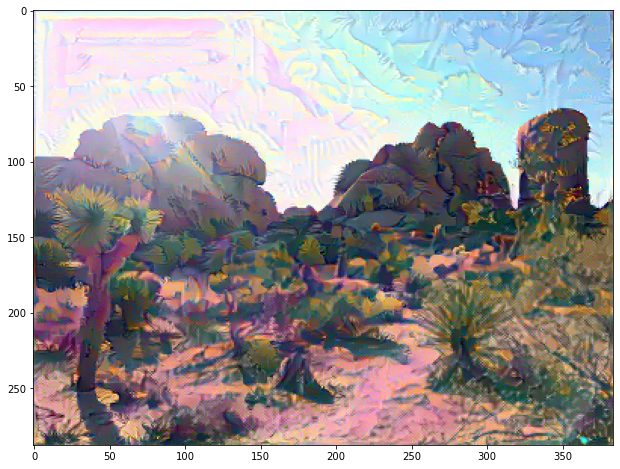

Content Loss: 0.3653148114681244 Style Loss: 561.90576171875
Content Loss: 0.3636529743671417 Style Loss: 543.1739501953125
Content Loss: 0.362091064453125 Style Loss: 525.4999389648438
Content Loss: 0.36044469475746155 Style Loss: 508.8471374511719
Content Loss: 0.3591694235801697 Style Loss: 493.0968322753906
Content Loss: 0.3582454323768616 Style Loss: 478.2506103515625
Content Loss: 0.35746777057647705 Style Loss: 464.28753662109375
Content Loss: 0.35675981640815735 Style Loss: 451.1114501953125
Content Loss: 0.3562668561935425 Style Loss: 438.6893005371094
Content Loss: 0.35582566261291504 Style Loss: 427.0030212402344
Content Loss: 0.3556228280067444 Style Loss: 415.9107971191406
Content Loss: 0.35538455843925476 Style Loss: 405.38043212890625
Content Loss: 0.3547961711883545 Style Loss: 395.40362548828125
Content Loss: 0.35441404581069946 Style Loss: 385.93060302734375
Content Loss: 0.3540036380290985 Style Loss: 376.9161071777344
Content Loss: 0.3537209928035736 Style Loss: 368

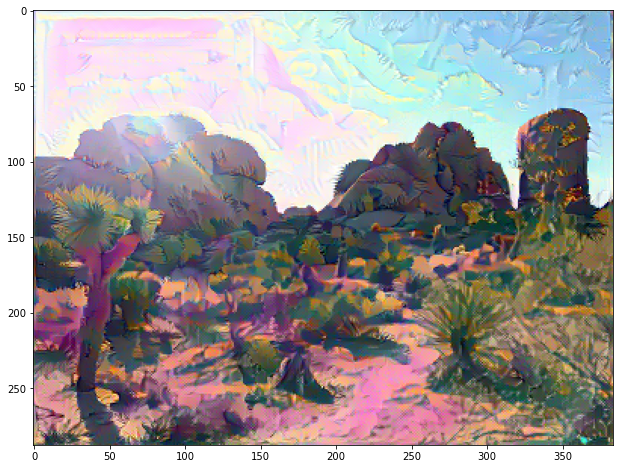

Content Loss: 0.35388922691345215 Style Loss: 331.0675964355469
Content Loss: 0.35386303067207336 Style Loss: 324.5809326171875
Content Loss: 0.3538658022880554 Style Loss: 318.352783203125
Content Loss: 0.3534349799156189 Style Loss: 312.38006591796875
Content Loss: 0.3530757427215576 Style Loss: 306.6304626464844
Content Loss: 0.3527619540691376 Style Loss: 301.11614990234375
Content Loss: 0.35231801867485046 Style Loss: 295.8222351074219
Content Loss: 0.35222166776657104 Style Loss: 290.7223815917969
Content Loss: 0.35214346647262573 Style Loss: 285.8273010253906
Content Loss: 0.3524131774902344 Style Loss: 281.11273193359375
Content Loss: 0.3528132140636444 Style Loss: 276.5717468261719
Content Loss: 0.35333213210105896 Style Loss: 272.1955261230469
Content Loss: 0.3538484573364258 Style Loss: 267.9723815917969
Content Loss: 0.3542613685131073 Style Loss: 263.8946533203125
Content Loss: 0.3545554578304291 Style Loss: 259.9562683105469
Content Loss: 0.3547583818435669 Style Loss: 25

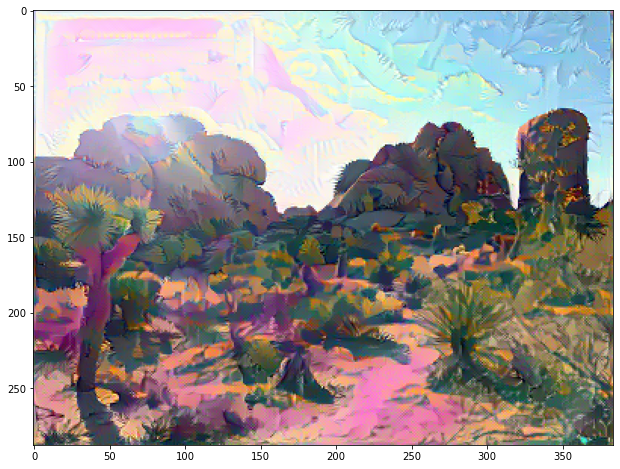

Content Loss: 0.3558386564254761 Style Loss: 238.9310302734375
Content Loss: 0.3555624783039093 Style Loss: 235.7957763671875
Content Loss: 0.3558766543865204 Style Loss: 232.74708557128906
Content Loss: 0.35542091727256775 Style Loss: 229.80752563476562
Content Loss: 0.3562723398208618 Style Loss: 226.94166564941406
Content Loss: 0.35514938831329346 Style Loss: 224.21205139160156
Content Loss: 0.35709285736083984 Style Loss: 221.56912231445312
Content Loss: 0.3542012870311737 Style Loss: 219.24864196777344
Content Loss: 0.3589155972003937 Style Loss: 217.25001525878906
Content Loss: 0.3514392375946045 Style Loss: 216.56109619140625
Content Loss: 0.36179691553115845 Style Loss: 216.11993408203125
Content Loss: 0.34711167216300964 Style Loss: 219.9223175048828
Content Loss: 0.36374881863594055 Style Loss: 217.6046600341797
Content Loss: 0.3448261022567749 Style Loss: 221.59852600097656
Content Loss: 0.3614260256290436 Style Loss: 211.39266967773438
Content Loss: 0.35040345788002014 Styl

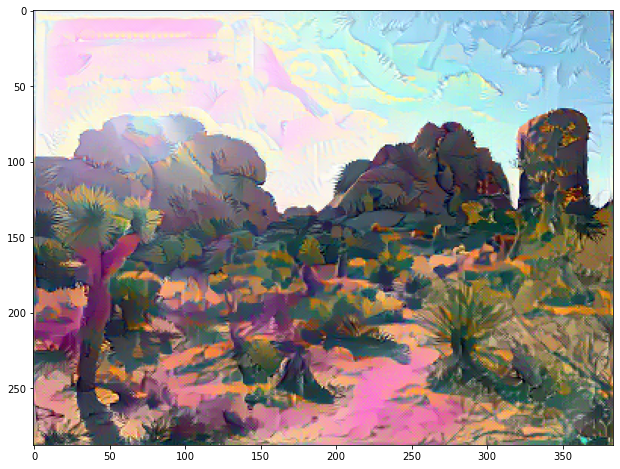

Content Loss: 0.34738126397132874 Style Loss: 199.87887573242188
Content Loss: 0.35535043478012085 Style Loss: 193.9188232421875
Content Loss: 0.35240116715431213 Style Loss: 190.8824462890625
Content Loss: 0.34984150528907776 Style Loss: 190.1637420654297
Content Loss: 0.3569582402706146 Style Loss: 189.4154815673828
Content Loss: 0.34822165966033936 Style Loss: 189.14549255371094
Content Loss: 0.3571102023124695 Style Loss: 185.88194274902344
Content Loss: 0.34976083040237427 Style Loss: 183.25955200195312
Content Loss: 0.3539406359195709 Style Loss: 179.9575653076172
Content Loss: 0.3530176877975464 Style Loss: 178.0364990234375
Content Loss: 0.35064712166786194 Style Loss: 176.97921752929688
Content Loss: 0.35661327838897705 Style Loss: 176.150634765625
Content Loss: 0.34839507937431335 Style Loss: 176.73104858398438
Content Loss: 0.3599048852920532 Style Loss: 176.4436492919922
Content Loss: 0.3461097180843353 Style Loss: 178.1267852783203
Content Loss: 0.359273761510849 Style Los

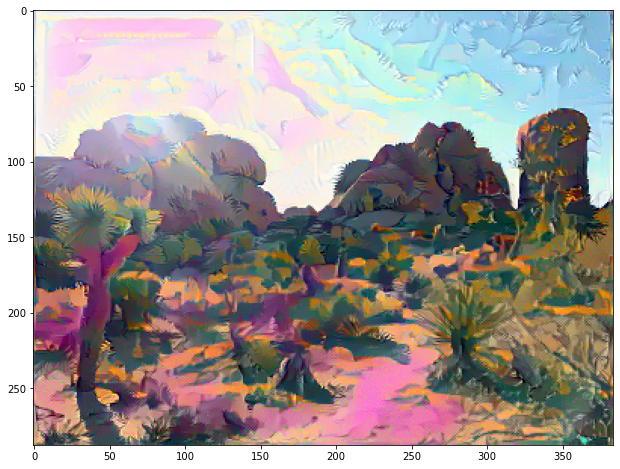

Content Loss: 0.357463002204895 Style Loss: 166.13133239746094
Content Loss: 0.34732553362846375 Style Loss: 166.24917602539062
Content Loss: 0.35763096809387207 Style Loss: 162.6687469482422
Content Loss: 0.3502790629863739 Style Loss: 159.93577575683594
Content Loss: 0.3534127473831177 Style Loss: 157.33108520507812
Content Loss: 0.3545273244380951 Style Loss: 156.40231323242188
Content Loss: 0.3496156334877014 Style Loss: 156.61280822753906
Content Loss: 0.35755404829978943 Style Loss: 156.5665283203125
Content Loss: 0.3471794128417969 Style Loss: 157.7615203857422
Content Loss: 0.35856232047080994 Style Loss: 156.0231475830078
Content Loss: 0.3474811017513275 Style Loss: 154.9456329345703
Content Loss: 0.355544775724411 Style Loss: 150.56703186035156
Content Loss: 0.35212141275405884 Style Loss: 148.43861389160156
Content Loss: 0.3511182367801666 Style Loss: 147.86590576171875
Content Loss: 0.3565329909324646 Style Loss: 148.08396911621094
Content Loss: 0.3479938209056854 Style Los

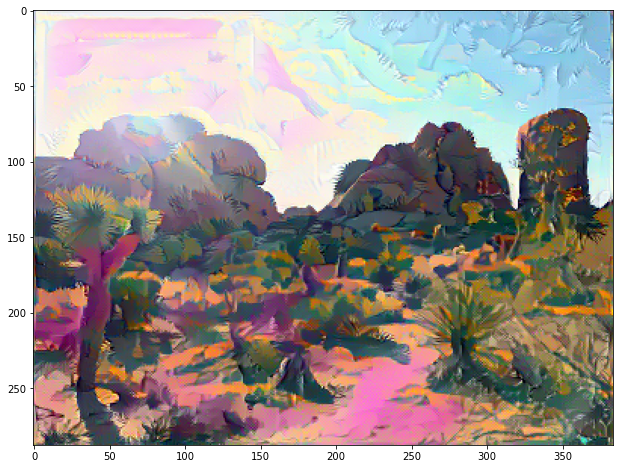

Content Loss: 0.35251638293266296 Style Loss: 140.8475341796875
Content Loss: 0.3556908965110779 Style Loss: 141.06649780273438
Content Loss: 0.3483844995498657 Style Loss: 142.68443298339844
Content Loss: 0.35876280069351196 Style Loss: 142.942626953125
Content Loss: 0.346415638923645 Style Loss: 143.95452880859375
Content Loss: 0.35762250423431396 Style Loss: 139.904541015625
Content Loss: 0.34926676750183105 Style Loss: 137.10523986816406
Content Loss: 0.35241106152534485 Style Loss: 134.7668914794922
Content Loss: 0.35480400919914246 Style Loss: 134.63812255859375
Content Loss: 0.3487459719181061 Style Loss: 135.8955535888672
Content Loss: 0.35836559534072876 Style Loss: 136.31134033203125
Content Loss: 0.34658846259117126 Style Loss: 137.89801025390625
Content Loss: 0.35851848125457764 Style Loss: 135.20321655273438
Content Loss: 0.34797394275665283 Style Loss: 133.1728515625
Content Loss: 0.353839635848999 Style Loss: 129.54002380371094
Content Loss: 0.3528846502304077 Style Loss

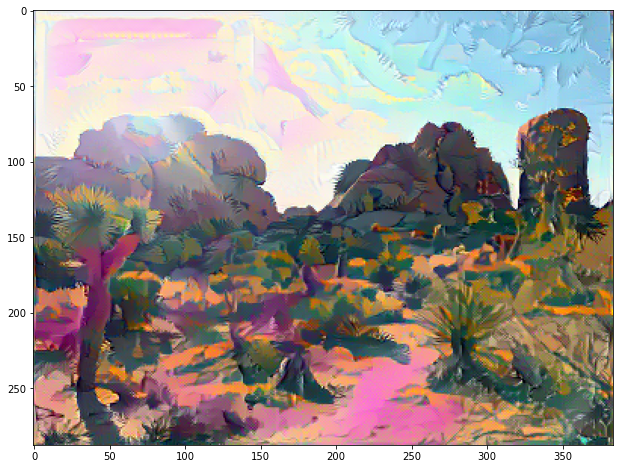

Content Loss: 0.34581491351127625 Style Loss: 130.26792907714844
Content Loss: 0.3537695109844208 Style Loss: 125.61701202392578
Content Loss: 0.34978145360946655 Style Loss: 123.64131164550781
Content Loss: 0.34804701805114746 Style Loss: 123.74800872802734
Content Loss: 0.3542991578578949 Style Loss: 124.8132095336914
Content Loss: 0.34489905834198 Style Loss: 127.54573059082031
Content Loss: 0.3572719097137451 Style Loss: 127.65101623535156
Content Loss: 0.3444579541683197 Style Loss: 129.07997131347656
Content Loss: 0.3563249111175537 Style Loss: 123.54161834716797
Content Loss: 0.3497034013271332 Style Loss: 120.41039276123047
Content Loss: 0.35104238986968994 Style Loss: 118.99948120117188
Content Loss: 0.35474368929862976 Style Loss: 119.97478485107422
Content Loss: 0.3459261357784271 Style Loss: 122.97855377197266
Content Loss: 0.3573705852031708 Style Loss: 124.32936096191406
Content Loss: 0.34350109100341797 Style Loss: 127.96016693115234
Content Loss: 0.357566237449646 Style

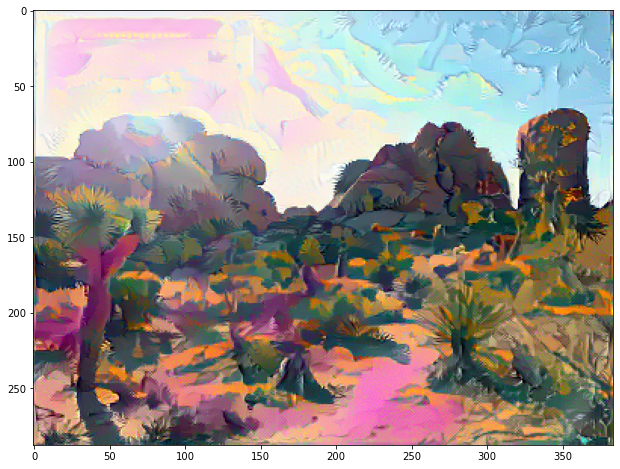

Content Loss: 0.3572947680950165 Style Loss: 121.202880859375
Content Loss: 0.34311339259147644 Style Loss: 125.54281616210938
Content Loss: 0.35717132687568665 Style Loss: 120.2076187133789
Content Loss: 0.34636229276657104 Style Loss: 116.5388412475586
Content Loss: 0.3508932888507843 Style Loss: 112.13101959228516
Content Loss: 0.35237011313438416 Style Loss: 112.73110961914062
Content Loss: 0.3446218967437744 Style Loss: 116.35761260986328
Content Loss: 0.35577794909477234 Style Loss: 118.25885772705078
Content Loss: 0.34243419766426086 Style Loss: 122.34901428222656
Content Loss: 0.3558695614337921 Style Loss: 116.43187713623047
Content Loss: 0.3464021384716034 Style Loss: 112.2219009399414
Content Loss: 0.349578857421875 Style Loss: 108.90428161621094
Content Loss: 0.3530343472957611 Style Loss: 110.27925872802734
Content Loss: 0.3444935381412506 Style Loss: 114.12632751464844
Content Loss: 0.3557949662208557 Style Loss: 114.304443359375
Content Loss: 0.3430772125720978 Style Los

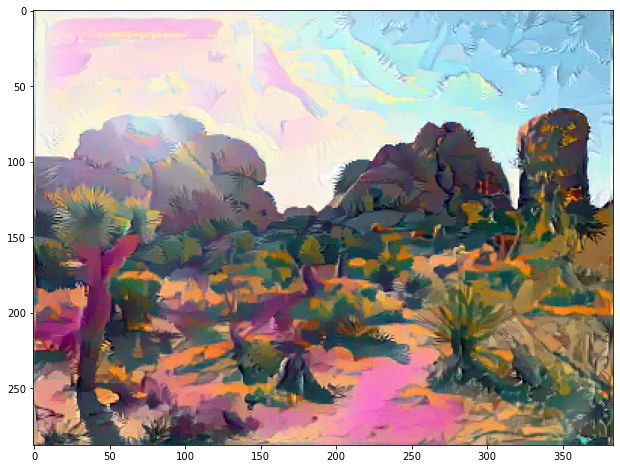

Content Loss: 0.3431260287761688 Style Loss: 110.89028930664062
Content Loss: 0.35468360781669617 Style Loss: 110.7117691040039
Content Loss: 0.3429954946041107 Style Loss: 111.26669311523438
Content Loss: 0.3528783619403839 Style Loss: 105.5650405883789
Content Loss: 0.34759363532066345 Style Loss: 102.76893615722656
Content Loss: 0.3467412292957306 Style Loss: 102.66637420654297
Content Loss: 0.35196322202682495 Style Loss: 104.05511474609375
Content Loss: 0.34329143166542053 Style Loss: 106.71131896972656
Content Loss: 0.35369670391082764 Style Loss: 106.16466522216797
Content Loss: 0.34315764904022217 Style Loss: 106.05937194824219
Content Loss: 0.3518674671649933 Style Loss: 101.54605102539062
Content Loss: 0.3478136658668518 Style Loss: 99.29048919677734
Content Loss: 0.34703776240348816 Style Loss: 99.2361831665039
Content Loss: 0.352020800113678 Style Loss: 100.36099243164062
Content Loss: 0.3434872329235077 Style Loss: 102.80962371826172
Content Loss: 0.3539126217365265 Style 

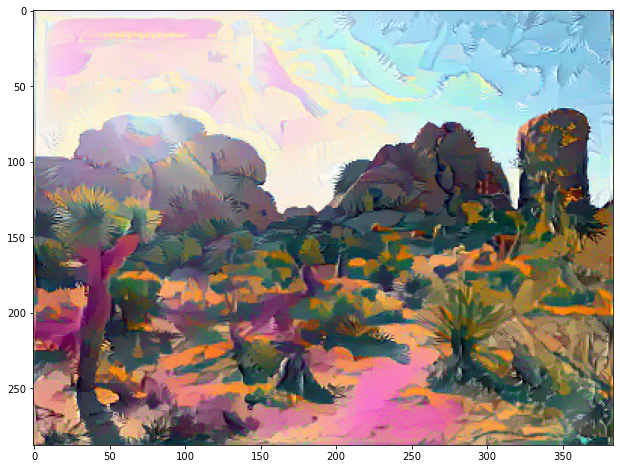

Content Loss: 0.3499198257923126 Style Loss: 97.01839447021484
Content Loss: 0.3424462080001831 Style Loss: 99.43087005615234
Content Loss: 0.3525109589099884 Style Loss: 99.8659439086914
Content Loss: 0.3417014479637146 Style Loss: 101.10750579833984
Content Loss: 0.35175588726997375 Style Loss: 97.01988220214844
Content Loss: 0.3453816771507263 Style Loss: 94.2931900024414
Content Loss: 0.346849650144577 Style Loss: 93.00232696533203
Content Loss: 0.3502131700515747 Style Loss: 93.93084716796875
Content Loss: 0.34319379925727844 Style Loss: 96.25482940673828
Content Loss: 0.3528871238231659 Style Loss: 97.03195190429688
Content Loss: 0.3420015871524811 Style Loss: 98.75918579101562
Content Loss: 0.35224226117134094 Style Loss: 95.11298370361328
Content Loss: 0.3447803854942322 Style Loss: 92.42427825927734
Content Loss: 0.34706661105155945 Style Loss: 90.40151977539062
Content Loss: 0.3492244482040405 Style Loss: 90.9904556274414
Content Loss: 0.3433293104171753 Style Loss: 93.110488

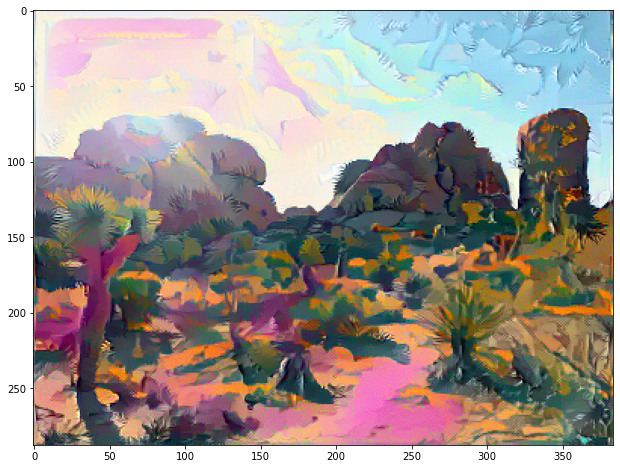

Content Loss: 0.34856536984443665 Style Loss: 88.18401336669922
Content Loss: 0.3485356569290161 Style Loss: 87.9375
Content Loss: 0.34430423378944397 Style Loss: 89.44837951660156
Content Loss: 0.351418673992157 Style Loss: 90.50715637207031
Content Loss: 0.3419947028160095 Style Loss: 92.48455810546875
Content Loss: 0.3517445921897888 Style Loss: 91.07534790039062
Content Loss: 0.3421529531478882 Style Loss: 90.07567596435547
Content Loss: 0.34850403666496277 Style Loss: 86.63359832763672
Content Loss: 0.34573379158973694 Style Loss: 85.36377716064453
Content Loss: 0.3439931571483612 Style Loss: 85.82103729248047
Content Loss: 0.34944775700569153 Style Loss: 86.94902801513672
Content Loss: 0.3414212465286255 Style Loss: 89.50824737548828
Content Loss: 0.3522481918334961 Style Loss: 90.47233581542969
Content Loss: 0.3397100865840912 Style Loss: 92.82221984863281
Content Loss: 0.3502793610095978 Style Loss: 88.08048248291016
Content Loss: 0.34253957867622375 Style Loss: 84.984603881835

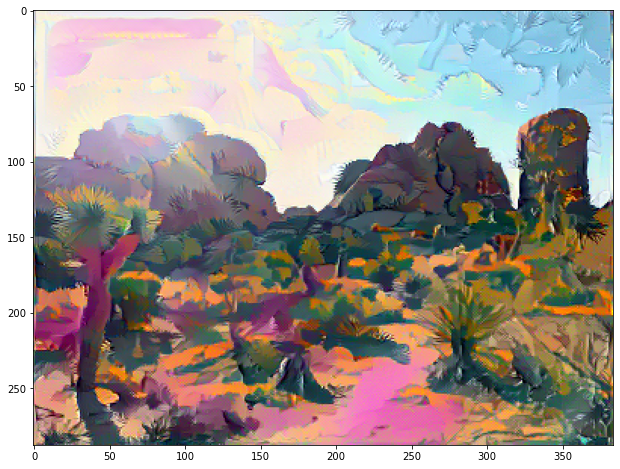

Content Loss: 0.33953574299812317 Style Loss: 93.40482330322266
Content Loss: 0.35288500785827637 Style Loss: 88.98931884765625
Content Loss: 0.34241393208503723 Style Loss: 85.813720703125
Content Loss: 0.34719234704971313 Style Loss: 81.82431030273438
Content Loss: 0.3483794033527374 Style Loss: 82.44436645507812
Content Loss: 0.34150272607803345 Style Loss: 85.84996032714844
Content Loss: 0.3517705798149109 Style Loss: 88.06809997558594
Content Loss: 0.3384133577346802 Style Loss: 92.5640640258789
Content Loss: 0.35091468691825867 Style Loss: 88.56961059570312
Content Loss: 0.33948415517807007 Style Loss: 86.09357452392578
Content Loss: 0.34496167302131653 Style Loss: 80.87984466552734
Content Loss: 0.3445117473602295 Style Loss: 80.61896514892578
Content Loss: 0.3397739827632904 Style Loss: 83.54442596435547
Content Loss: 0.3488454520702362 Style Loss: 86.53974914550781
Content Loss: 0.3367254436016083 Style Loss: 93.43360900878906
Content Loss: 0.3514123857021332 Style Loss: 91.14

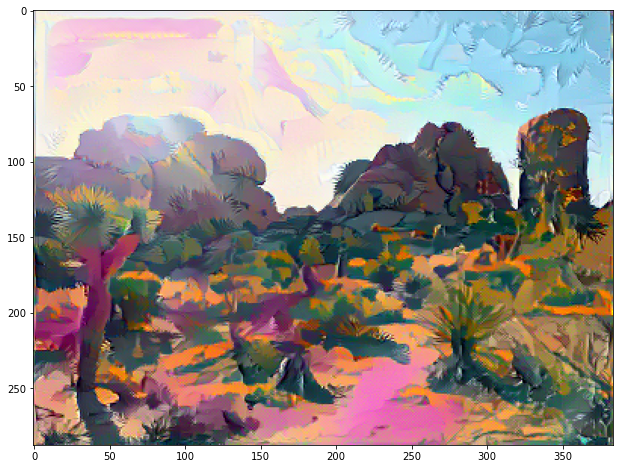

Content Loss: 0.3504182994365692 Style Loss: 87.83660125732422
Content Loss: 0.3362419605255127 Style Loss: 95.65644836425781
Content Loss: 0.3520525395870209 Style Loss: 90.58039855957031
Content Loss: 0.3387587368488312 Style Loss: 87.30509948730469
Content Loss: 0.34627193212509155 Style Loss: 79.13190460205078
Content Loss: 0.347128301858902 Style Loss: 79.56928253173828
Content Loss: 0.3395121395587921 Style Loss: 85.14485931396484
Content Loss: 0.3511042892932892 Style Loss: 88.19221496582031
Content Loss: 0.33530890941619873 Style Loss: 94.97160339355469
Content Loss: 0.34965240955352783 Style Loss: 87.64192199707031
Content Loss: 0.3385202884674072 Style Loss: 82.9732437133789
Content Loss: 0.343183308839798 Style Loss: 77.76441955566406
Content Loss: 0.34641462564468384 Style Loss: 79.49220275878906
Content Loss: 0.3386063873767853 Style Loss: 85.09766387939453
Content Loss: 0.35058706998825073 Style Loss: 86.90227508544922
Content Loss: 0.3373951017856598 Style Loss: 90.70825

In [14]:
passes = 300

for idx in tqdm(range(passes)):
    
    input_content = [get_content(norm(input_img), i) for i in content_layers]
    input_style = [get_style_matrix(norm(input_img), vgg.features, i) for i in style_layers]
    
    loss = lossFun(input_content, input_style)
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # make sure we don't go out of the [0,1] range
    # we don't want to accidently push the pixels to be all black or all white
    input_img.data.clamp_(0,1)

    # take a look at your progress!
    if idx % 20 == 0:
        img = input_img.detach()
        img = np.transpose(np.array(img[0]), (1,2,0))
        
        plt.imshow(img)
        plt.show()

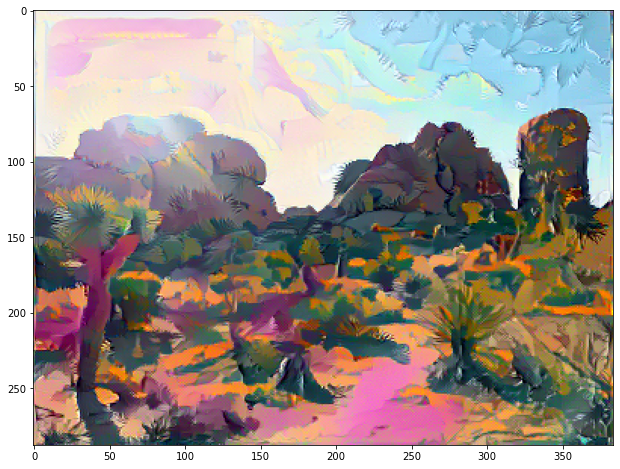

In [15]:
# show image
img = input_img.detach()
img = np.transpose(np.array(img[0]), (1,2,0))

plt.imshow(img)

I like this result for a few reasons
- You can definitely see some elements of the style image clearly being transferred (especially on the middle right side of the image)
- You can also see it is not perfect: elements of the style image and definitely being transferred but not necessarily in the way we *want*. For example the fuzzy bits of the joshua tree in the style image and transferred to many different parts of the image.
- This is a very basic style transfer algorithm; remember there are other algorithms for doing this!

In [17]:
plt.imsave('style_transfer_joshua_tree.jpg', np.clip(img, 0, 1))